In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
sns.set()

In [42]:
df=pd.read_csv('FitBit data.csv')
df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [5]:
import pandas_profiling

In [6]:
df.profile_report()

In [3]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,457.0,4.628595e+09,2.293781e+09,1.503960e+09,2.347168e+09,4.057193e+09,6.391747e+09,8.877689e+09
TotalSteps,457.0,6.546562e+03,5.398493e+03,0.000000e+00,1.988000e+03,5.986000e+03,1.019800e+04,2.849700e+04
TotalDistance,457.0,4.663523e+00,4.082072e+00,0.000000e+00,1.410000e+00,4.090000e+00,7.160000e+00,2.753000e+01
TrackerDistance,457.0,4.609847e+00,4.068540e+00,0.000000e+00,1.280000e+00,4.090000e+00,7.110000e+00,2.753000e+01
LoggedActivitiesDistance,457.0,1.794274e-01,8.492318e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.727057e+00
VeryActiveDistance,457.0,1.180897e+00,2.487159e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.310000e+00,2.192000e+01
ModeratelyActiveDistance,457.0,4.786433e-01,8.309952e-01,0.000000e+00,0.000000e+00,2.000000e-02,6.700000e-01,6.400000e+00
LightActiveDistance,457.0,2.890197e+00,2.237523e+00,0.000000e+00,8.700000e-01,2.930000e+00,4.460000e+00,1.251000e+01
SedentaryActiveDistance,457.0,1.903720e-03,8.486801e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e-01
VeryActiveMinutes,457.0,1.662363e+01,2.891970e+01,0.000000e+00,0.000000e+00,0.000000e+00,2.500000e+01,2.020000e+02


In [8]:
# there are no missing values
# various attributes have majorty number of zeros but as this is health tracker, so without domain experties I cannot delete them.

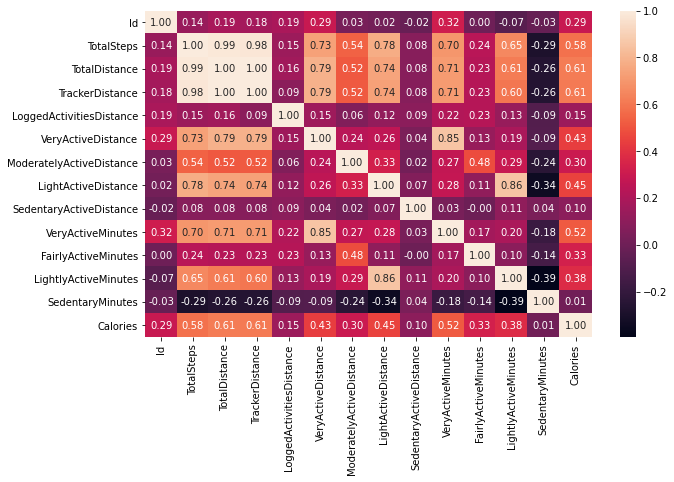

In [5]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(),annot=True,fmt='0.2f')

In [7]:
# we got a deep intution from the heat map.
# 'totalsteps','totaldistance','trackerdistance' are highly correlated. so there is multycolinearities.
# apart from them there are multiple independent attributes are corealated.
# we will delete them after EDA.

In [11]:
# EDA

In [43]:
df.ActivityDate=pd.to_datetime(df.ActivityDate)

In [44]:
df['month']=df.ActivityDate.dt.month
df['date']=df.ActivityDate.dt.day

In [45]:
df['day']=df.ActivityDate.dt.we

In [52]:
from datetime import date
import calendar
my_date = date.today()
#lendar.day_name[my_date.weekday()]
df['day']=df.ActivityDate.apply(lambda x:calendar.day_name[x.weekday()] )

In [53]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,month,date,day
0,1503960366,2016-03-25,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,3,25,Friday
1,1503960366,2016-03-26,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,3,26,Saturday
2,1503960366,2016-03-27,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,3,27,Sunday
3,1503960366,2016-03-28,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,3,28,Monday
4,1503960366,2016-03-29,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,3,29,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,2016-04-08,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,4,8,Friday
453,8877689391,2016-04-09,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,4,9,Saturday
454,8877689391,2016-04-10,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,4,10,Sunday
455,8877689391,2016-04-11,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,4,11,Monday


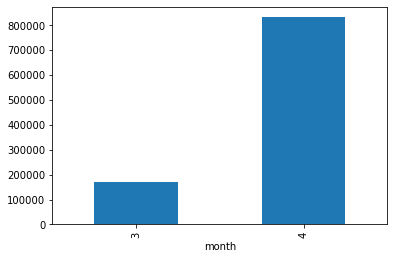

In [31]:
df.groupby('month')['Calories'].sum().plot(kind='bar')

In [36]:
# in the month of april the calories are burnt more.

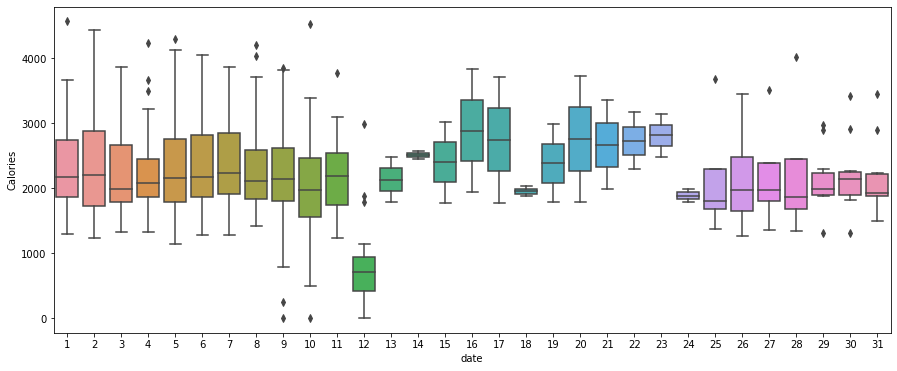

In [35]:
plt.figure(figsize=(15,6))
sns.boxplot(df.date,df.Calories)

In [37]:
# per day basis the calories burnt are varies.

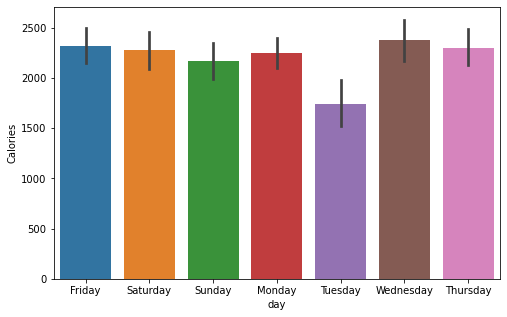

In [56]:
plt.figure(figsize=(8,5))
sns.barplot(df.day,df.Calories)

In [57]:
# In Tuesday less calory is burnt and highest is on Wednesday.

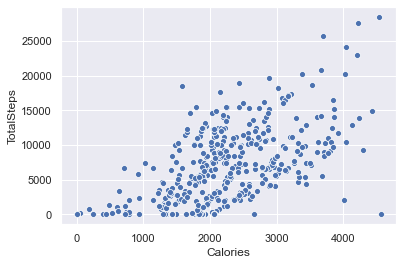

In [63]:
sns.scatterplot(df.Calories,df.TotalSteps)

In [64]:
# Calories burnt is almost linearly related with Total step.

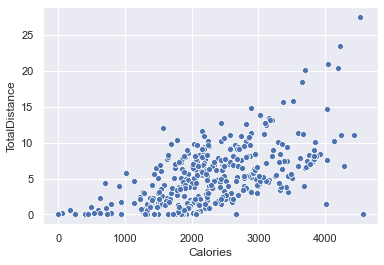

In [65]:
sns.scatterplot(df.Calories,df.TotalDistance)

In [66]:
# Calories burnt is almost linearly related with Total distances.

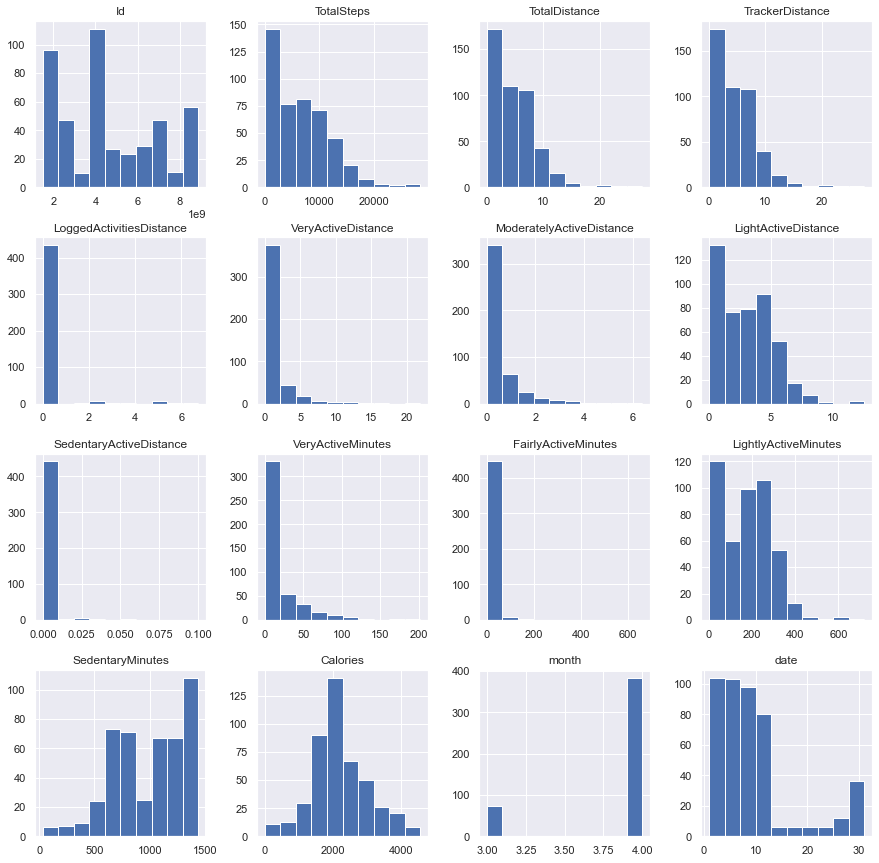

In [67]:
df.hist(figsize=(15,15))
plt.show()

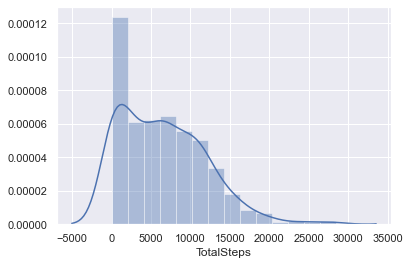

In [68]:
sns.distplot(df['TotalSteps'])

In [69]:
# we have found that almost 40% people are stepping less than 10000.

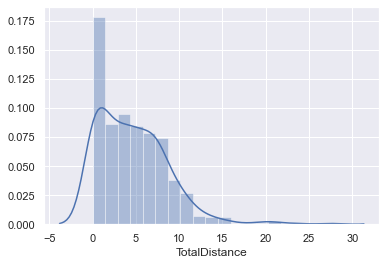

In [70]:
sns.distplot(df['TotalDistance'])

In [71]:
# approx 70% people walk less than 10 km.

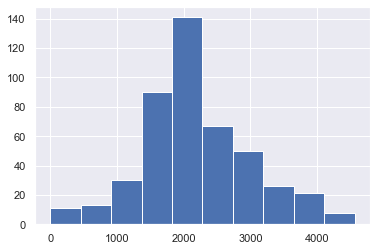

In [73]:
plt.hist(df.Calories)
plt.show()

In [74]:
# data is normally distributed.
# so that we can say maximum people burnt mean 2000 calories.

In [76]:
# model building

In [78]:
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()

In [87]:
x=df.drop(['Calories','ActivityDate','Id','day'],axis=1)
y=df['Calories']

In [89]:
x=sc.fit_transform(x)

In [77]:
from sklearn.decomposition import PCA
pca=PCA()

In [90]:
principle_component=pca.fit_transform(x)

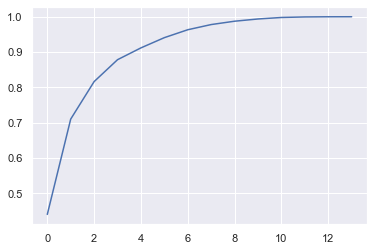

In [91]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

In [93]:
# we are taking 8 principle components.
pca=PCA(n_components=8)
new_data=pca.fit_transform(x)

In [94]:
from sklearn.model_selection import train_test_split,GridSearchCV
x_train,x_test,y_train,y_test=train_test_split(new_data,y,test_size=0.25)

In [95]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB

In [96]:
grid_param={
    'n_estimators':[70,100,120,150],
    'min_samples_leaf':[2,4,5],
    'min_samples_split': [4,5,6]
}

In [97]:
grid_search=GridSearchCV(RandomForestRegressor(),param_grid=grid_param,cv=3)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'min_samples_leaf': [2, 4, 5],
                         'min_samples_split': [4, 5, 6],
                         'n_estimators': [70, 100, 120, 150]})

In [98]:
grid_search.best_params_

{'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 120}

In [99]:
forest=RandomForestRegressor(n_estimators=120,min_samples_leaf=2,min_samples_split=5)
forest.fit(x_train,y_train)
pred=forest.predict(x_test)

In [101]:
from sklearn.metrics import mean_squared_error

In [102]:
math.sqrt(mean_squared_error(pred,y_test))

556.7093515881186

In [103]:
y_test.describe()

count     115.000000
mean     2230.973913
std       804.644582
min         0.000000
25%      1790.500000
50%      2101.000000
75%      2741.500000
max      4286.000000
Name: Calories, dtype: float64

In [104]:
pred.std()

536.606716067064

In [109]:
grid_param={
    'base_estimator':[DecisionTreeRegressor()],
    'n_estimators':[8,10,15,20,25,30,50]
}

In [110]:
grid_search=GridSearchCV(BaggingRegressor(),param_grid=grid_param,cv=5)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=BaggingRegressor(),
             param_grid={'base_estimator': [DecisionTreeRegressor()],
                         'n_estimators': [8, 10, 15, 20, 25, 30, 50]})

In [111]:
grid_search.best_params_

{'base_estimator': DecisionTreeRegressor(), 'n_estimators': 25}

In [112]:
bagging=BaggingRegressor(base_estimator=DecisionTreeRegressor(),n_estimators=25)

In [113]:
bagging.fit(x_train,y_train)

BaggingRegressor(base_estimator=DecisionTreeRegressor(), n_estimators=25)

In [114]:
pred=bagging.predict(x_test)

In [115]:
math.sqrt(mean_squared_error(pred,y_test))

580.7579221973863

In [116]:
grid_param={
    'learning_rate':[0.1,0.01,0.001,0.02,0.002],
    'n_estimators':[80,100,120,150],
    'min_samples_leaf':[2,4,5],
    'min_samples_split': [4,5,6]
}

In [117]:
grid_search=GridSearchCV(GradientBoostingRegressor(),param_grid=grid_param,cv=5)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001, 0.02, 0.002],
                         'min_samples_leaf': [2, 4, 5],
                         'min_samples_split': [4, 5, 6],
                         'n_estimators': [80, 100, 120, 150]})

In [118]:
grid_search.best_params_

{'learning_rate': 0.1,
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'n_estimators': 80}

In [119]:
grad=GradientBoostingRegressor(learning_rate=0.1,min_samples_leaf=2,min_samples_split=4,n_estimators=80)
grad.fit(x_train,y_train)

GradientBoostingRegressor(min_samples_leaf=2, min_samples_split=4,
                          n_estimators=80)

In [120]:
pred=grad.predict(x_test)

In [121]:
math.sqrt(mean_squared_error(pred,y_test))

586.7429058858028

In [122]:
from xgboost import XGBRegressor

In [123]:
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred=xgb.predict(x_test)

In [124]:
math.sqrt(mean_squared_error(pred,y_test))

602.316693863948

In [125]:
# less SSE is giving by random forest.